# **Intro to SiS1 Labs**

The goal of the labs of Signal and Systems 1 is to gain knowledge on the course’s topics by solving a specific signal processing problem. By the end of the course, each group should be able to synthesize the sound produced by a plucked string instrument using the knowledge acquired in the theory and seminar classes. This will be a cumulative process, in each lab new techniques will be applied in order to improve the synthesis. First let's show what we will achieve by the end of the course. For each lab we need to import some auxiliary functions needed to load the audio files and listen to them:


In [33]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wav

In [34]:
!git clone https://github.com/pzinemanas/sis1lab.git
from sis1lab.util import load_audio, save_audio, plot_signals
from IPython.display import Audio

fatal: destination path 'sis1lab' already exists and is not an empty directory.


**Reference signal**

Now let's load and listen to a reference signal like the one you will use:

In [35]:
reference, fs = load_audio('sis1lab/audio/reference.wav')
Audio(reference, rate=fs)

**Synthesis**

Now we can load and listen to a synthesised signal like the one you will obtain and that tries to imitate the reference signal. This is an audio signal created from scratch only using the knowledge gained during the course.

In [36]:
synthesis, fs = load_audio('sis1lab/audio/synthesis.wav')
Audio(synthesis, rate=fs)

---

## **Lab 1**
In this lab you will choose your reference sound to be used for all the labs and start imitating it with a single sinusoid.

## **Exercises**

**1. Choose a reference sound**

1.1. Find a recording of a single plucked string sound. Be creative, do not choose “guitar” by default, nor copy a sound from another group. You can use [Freesound](https://freesound.org/) to find the recordings (Freesound is a huge collaborative database of audio snippets released under Creative Commons licenses created and maintained by researchers of the Music Technology Group of the UPF). Try to find a sound with the best possible quality. The ideal sound format should be: uncompress (such as.wav, .aiff, but no .mp3), mono (one channel) and with a sampling rate of  44100Hz. The sound file should also contain a single note. You can start by downloading a sound from freesound and modify it with Audacity to the right format and content.

https://freesound.org/people/Carlos_Vaquero/sounds/154023/

1.2. Create a github repository and upload your edited audio file there:

1) Sing up to github using your UPF gmail account: https://github.com/

2) Create a repository called **sis1_groupX** where X is your group number: https://docs.github.com/en/get-started/quickstart/create-a-repo

3) Upload your edited audio file to the repository


1.3. Now you can clone your repository and access the audio file locally. Change the following code (user name and file name) to clone the repository and load the audio file.

In [37]:
import os
os.listdir()
!rm -rf sis1_group12

In [38]:
!git clone https://github.com/JustCodingCapos/sis1_group12.git
filepath = "./sis1_group12/Plucked_String_Guitar_Sis1Group12.wav"
ref, fs = load_audio(filepath)

Cloning into 'sis1_group12'...
remote: Enumerating objects: 18, done.
remote: Counting objects: 100% (18/18), done.
remote: Compressing objects: 100% (18/18), done.
remote: Total 18 (delta 6), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (18/18), 6.20 MiB | 13.93 MiB/s, done.
Resolving deltas: 100% (6/6), done.


Note that `load_audio` function returns two variables: the audio signal (as a one dimensional array of floating point numbers), and the sampling rate (as a integer number). Now we can plot the audio signal:

In [39]:
plot_signals(ref, fs)

You can use the zoom in tool to see more details.

You can also use Audio widget to listen the audio signal:

In [40]:
Audio(ref, rate=fs)



---



**2. Measure the signal period**

2.1. Find the note frequency (fundamental frequency) based on the musical note name given in the file name or description (i.e. A3 note corresponds to the frequency 220 Hz. See https://pages.mtu.edu/~suits/notefreqs.html).

**ANSWER:** We're working with the A# note from the 2nd octave, which is 116.54Hz.

2.2. Calculate the period from the frequency value using Python:


In [41]:
# Write the code here
frequency = 116.54
period = 1 / frequency

print("Period: ", period, "seconds")

Period:  0.00858074480864939 seconds


2.3. Plot three periods of the signal using the `plot_signals` function and selecting `t_start` and `t_end` arguments accordingly. Try to get the first periods of the audio signal but avoiding the attack section.

In [42]:
# Write the code here
t_start = 1
t_end = 1 + 0.02574 #We know that 3 * period = 3 * 0.00858 = 0.02574
plot_signals(ref, fs, t_start, t_end)

2.4. Measure the period of the signal manually by identifying the begining and ending of a periodic cycle. Note that when you hover the mouse over one of the points in the plot, you can see the time and amplitude values. For instance, you can check the cross by zero.

**ANSWER:** We have located two consecutive zero crossings at t2 = 1.009097 and t1= 1.000593.
Now we calculate the difference T = t2 - t1 = 1.009097 - 1.000593 =0.008504 s

Then, the manually calculated signal period is 0.008504 s.

2.5. Do the measured (2.4) and theoretical (2.2) periods coincide? If not, explain why.

**ANSWER:** The measured and theoretical periods are closely aligned, with values of 0.008504 seconds and 0.008581 seconds, respectively, indicating only a slight discrepancy.



---



**3. Generating a sinusoid**

3.1. Create a sinusoid of the same duration than the reference signal and same frequency than the fundamental frequency. Plot it along with the audio signal of the reference recording. Plot the same time segment that 2.3. Note that the sampling rate should be the same for both signals. Try to find the values of Amplitude and initial Phase that make the two signal segments plotted to match as close as possible (do not attempt to imitate the whole signal). Matching the phase is a bit tricky.



In [43]:
# Write the code here
# Parameters
frequency = 1/0.00858  # Frequency of the sinusoid in Hz
amplitude = 0.06  # Amplitude of the sinusoid
duration = 6  # Duration of the time interval in seconds
sampling_rate = 44100  # Number of samples per second (sampling rate)
num_samples = int(duration * sampling_rate) # Calculate the number of samples based on duration and sampling rate

# Generate sinusoid
time = np.linspace(0, duration, num_samples) # Generate the time array using linspace
sinusoid_values = amplitude * np.sin(2 * np.pi * frequency * time + (np.pi/4)*np.pi)

# Plot the original and synthesized sinusoid
t_start = 1
t_end = 1.025
plot_signals(sinusoid_values, fs, t_start, t_end)
plot_signals((ref), fs, t_start, t_end)


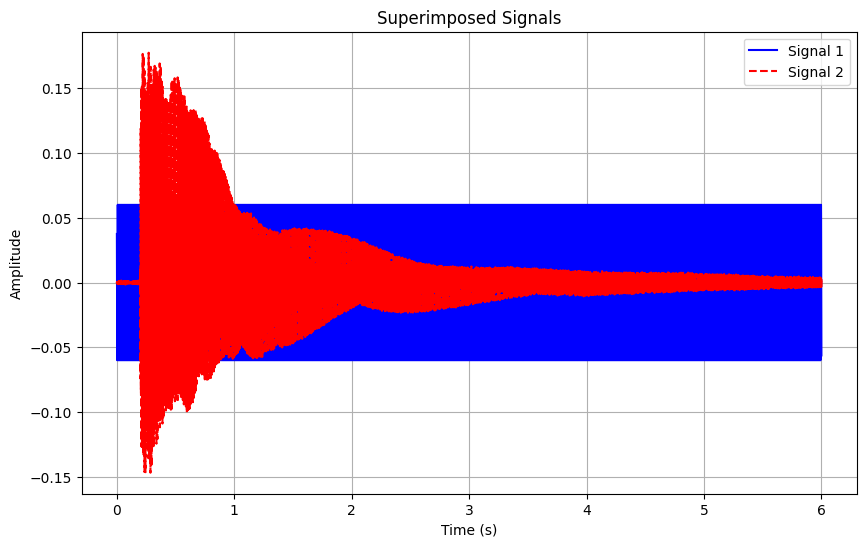

In [44]:
# Ensure both signals are of the same length for plotting and comparison.
# Get the minimum length between the two signals.
min_length = min(len(sinusoid_values), len(ref))

# Trim both signals to this minimum length.
sinusoid_values = sinusoid_values[:min_length]
ref = ref[:min_length]

# Generate a time array (x-axis for our plot).
# It starts from 0, spans the duration of the signals,
# and has as many points as the minimum length of our signals.
time = np.linspace(0, duration, min_length)

# Initialize a figure for plotting with a specified size.
plt.figure(figsize=(10, 6))

# Plot the first signal (sinusoid_values) in blue
# - time: X-axis
# - sinusoid_values: Y-axis
# - label: Name to be displayed in the legend
# - color: Color of the plotted line (blue in this case)
plt.plot(time, sinusoid_values, label='Signal 1', color='blue')

# Plot the second signal (ref) in red and with a dashed line
plt.plot(time, ref, label='Signal 2', color='red', linestyle='--')

# Labeling the X and Y axes to provide context on what's being plotted.
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

# Title for the plot to give a brief overview of what's being visualized.
plt.title('Superimposed Signals')

# Display a legend to identify which signal is which.
plt.legend()

# Add a grid for better readability of the plot.
plt.grid(True)

# Finally, render and display the plot.
plt.show()

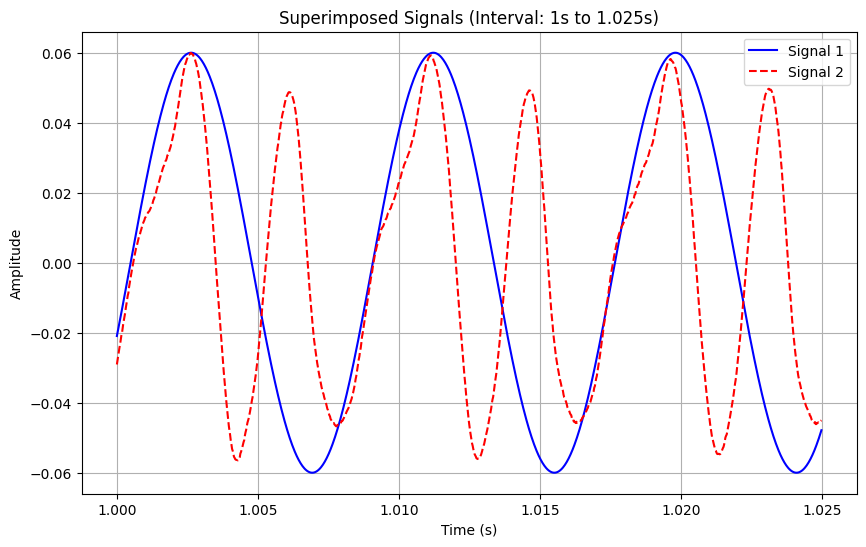

In [45]:
# Define the start and end times for the interval
start_time = 1
end_time = 1.025

# Convert these time values to indices.
# This will allow us to select the portion of the signal that falls within this time interval.
start_index = int(start_time * sampling_rate)
end_index = int(end_time * sampling_rate)

# Slice the time array and the two signals to get the desired interval
# This creates sub-arrays that only have data from the specified start to end times.
interval_time = time[start_index:end_index]
interval_signal1 = sinusoid_values[start_index:end_index]
interval_signal2 = ref[start_index:end_index]

# Initialize a new figure for plotting with a specified size.
plt.figure(figsize=(10, 6))

# Plot the first signal (sinusoid_values) in blue
plt.plot(interval_time, interval_signal1, label='Signal 1', color='blue')

# Plot the second signal (ref) in red and with a dashed line
plt.plot(interval_time, interval_signal2, label='Signal 2', color='red', linestyle='--')

plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Superimposed Signals (Interval: {}s to {}s)'.format(start_time, end_time))
plt.legend()
plt.grid(True)
plt.show()

**3.2**. What are the main differences between the two signals.

**ANSWER:** The original audio from the string instrument and the synthesized sound are quite different. The original sound has a rich and full quality because of the many tones it has. The synthesized sound is simpler, like a clear beep, because it only focuses on one main tone. The real instrument sound changes in loudness, starting strong and fading out. The synthesized sound stays the same loudness. The real sound has small noises and details from the instrument and the room. The synthesized sound is very clean and doesn't have these details. To sum up, the synthesized sound captures the note's pitch, but it misses the fullness and details of the real instrument sound.

3.3. Listen to the synthesized signal usign the Audio widget. Sounds natural?

**ANSWER**: The generated signal sounds much simpler and "cleaner" than the natural sound. This is because the sinusoid is a pure tone representation of the fundamental frequency without the harmonics, overtones, and intricacies of the instrument's sound.

In [46]:
# Write the code here
Audio(sinusoid_values, rate=fs)

3.4. Save the synthesized signal using the 'save_audio` function:

In [47]:
# Write the code here
filepath = "./sis1_group12/Plucked_String_Guitar_Sis1Group12_Sinusoid.wav"
save_audio(filepath,sinusoid_values,44100)